# Cell Tracking (Project 6)

**Group 12: Maximilian Karhausen, Johannes Simon**

**Background:** When testing a pharmacological drug onto cells, the effect on the cell population growth and 
overall phenotype is usually assessed by a single snapshot image. While these population and 
time-averaged measurements can highlight big scale effects between cell populations and 
conditions, they are an indirect measure of responses to chemotherapeutic drugs. Another 
approach is to record long videos of these cell populations while subjected to the drugs. These 
live observations are more accurate in capturing the proliferation behavior than standard 
approaches. Manual tracking of each single cell in the visual field is very time-consuming.

**Approach:** Given pre-detected cancer cells (in COCO format), we investigate suitable methods to match detections across frames (tracking). To do this, we compare the tracking methods SORT and DeepSORT with each other.

In [40]:
# Get all necessary imports
import cv2
import json
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import motmetrics as mm
import numpy as np
import random
import torch

from pathlib import Path
from PIL import Image

In [5]:
torch.cuda.is_available()

True

## Part 1: Load the dataset and classify the cells

In [41]:
# Initialize local paths
# Dataset path
# Hint: (change to "/scratch/cv-course/jsimon10/dataset_jpg/dataset" when working on RAMSES)
DATASET_DIR = Path("dataset_jpg/dataset")
# Annotations file path
ANN_FILE = DATASET_DIR / "annotations.json"
# Create folder for cropped cells, needed later to train appearance model for DeepSORT
CROP_DIR = Path("cell_crops")
CROP_DIR.mkdir(exist_ok=True)

In [42]:
# Load the COCO annotations from the annotations.json file
with ANN_FILE.open("r") as f:
    coco = json.load(f)
# Get category name by their ID
cat_name_by_id = {cat["id"]: cat["name"] for cat in coco["categories"]}
# Group all annotations by their image ID to find all cells for each image more easily
annots_by_img = {}
for ann in coco["annotations"]:
    annots_by_img.setdefault(ann["image_id"], []).append(ann)
# Group all images by their ID to find them more faster
img_by_id = {}
for img in coco["images"]:
    img_by_id[img["id"]] = img
# Print summary info on the dataset once loaded
print("Loaded dataset with:")
print(f"  - {len(coco['images'])} images")
print(f"  - {len(coco['annotations'])} annotations")
print(f"  - {len(coco['categories'])} categories:")
for cat_id, cat_name in cat_name_by_id.items():
    print(f"    ID {cat_id}: {cat_name}")

Loaded dataset with:
  - 40350 images
  - 2204912 annotations
  - 2 categories:
    ID 1: living_cell
    ID 2: dead_cell


In [12]:
# Extract special events (cell division and death) for visualization later as (video_name, event_frame_id, cell_id, 'division'/'death')
events = []
# Group all video IDs by their name to find them more easily
video_id_by_name = {v["id"]: v["name"] for v in coco["videos"]}
# Loop through annotations to find all cell divisions and deaths
for ann in coco["annotations"]:
    vid = ann["video_id"]
    vid_name = video_id_by_name[vid]
    time_div = ann.get("time_of_division")
    # Add the frame where a cell divides to special events
    if time_div is not None:
        events.append((vid_name, int(time_div), ann["cell_id"], "division"))
    time_death = ann.get("time_of_death")
    # Add the frame where a cell dies to special events
    if time_death is not None:
        events.append((vid_name, int(time_death), ann["cell_id"], "death"))

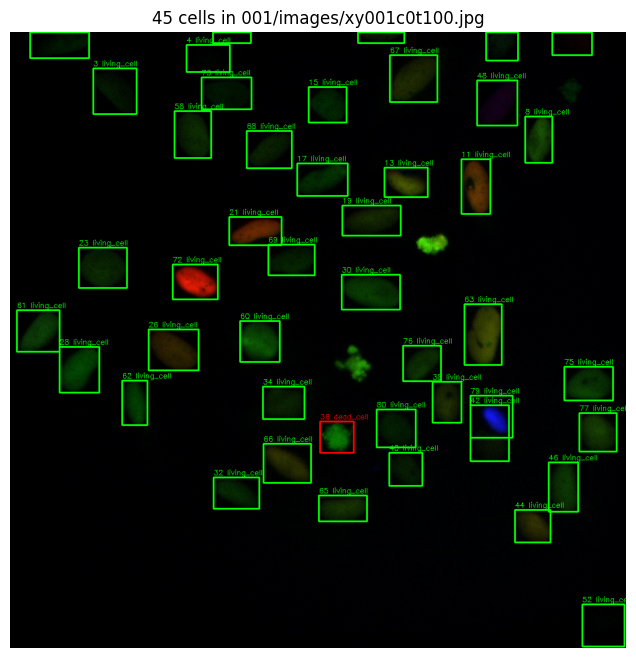

In [14]:
# Get an image by an selected index for visualization
img_example = img_by_id[100] # For testing, only index of 0-449 works. Original dataset: up to 40349
# Get the path to the image
img_path = DATASET_DIR / img_example["file_name"]
# Raise an error if image does not exist
if not img_path.exists():
    raise FileNotFoundError(f"Image file not found: {img_path}")
# Load the image and turn from BGR to RGB
img_rgb = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
# Get annotations for the selected image
annots = annots_by_img.get(img_example["id"], [])
# Apply different colors for bounding boxes of different classes
bbox_color_map = {
    "living_cell": (0, 255, 0),     # green for living cell
    "dead_cell": (255, 0, 0),     # red for dead cell
}
# Draw bounding boxes based on annotations
for i, ann in enumerate(annots):
    # Get center x and y coordinates of the bounding box with width and height
    x_center, y_center, width, height = ann["bbox"]
    # For correct drawing (and SORT later), convert center-based x and y coordinates to top-left
    x, y = x_center - width / 2, y_center - height / 2
    # For correct drawing, turn float values to int values - OpenCV expects int values
    x_draw, y_draw, width_draw, height_draw = int(x), int(y), int(width), int(height)
    # Get the classified category
    cat_id = ann["category_id"]
    # Get the respective category name
    cat_name = cat_name_by_id.get(cat_id, "unknown") # Edge case: If annotation without category exist, label as "unknown"
    # Construct label with cell ID and category name, e.g. 30 living_cell
    label = f"{ann['cell_id']} {cat_name}"
    # Get the respective color of bounding box
    color = bbox_color_map.get(cat_name, (255, 255, 255)) # Edge case: If annotation without category exist, color white
    # Draw the bounding boxes and the text with the classified category 
    cv2.rectangle(img_rgb, (x_draw, y_draw), (x_draw + width_draw, y_draw + height_draw), color, 2)
    cv2.putText(img_rgb, label, (x_draw, y_draw - 4), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)
# Show classification result
plt.figure(figsize=(12, 8))
plt.imshow(img_rgb)
plt.axis("off")
plt.title(f"{len(annots)} cells in {img_example['file_name']}")
plt.show()

## Part 2: Prepare the data for DeepSORT

In [16]:
# Get all folder names in a sorted list
all_folders = sorted([f.name for f in DATASET_DIR.iterdir() if f.is_dir()])
# Ensure reproducibility with same sequence of random folders
random.seed(30)
# Shuffle the list of folders randomly
random.shuffle(all_folders)
# Split the folders by 70% for training (with cropped cells), 15% validation and 15% testing (both for tracking)
split_train_idx = int(0.7 * len(all_folders))
train_folders = set(all_folders[:split_train_idx])
test_folders = set(all_folders[split_train_idx:])
# Convert to a list before slicing again to prevent TypeError
test_folders = list(test_folders)
split_test_idx = int(0.5 * len(test_folders))
val_folders = set(test_folders[:split_test_idx])
test_folders = set(test_folders[split_test_idx:])

In [25]:
# Cache for loaded images by image_id to improve processing speed
loaded_images = {}
# Get already cropped cell ID folders to skip if kernel crashes during cropping
already_done_ids = {p.name for p in CROP_DIR.iterdir() if p.is_dir()}
# Take only a maximum of 250 cells per video / folder to prevent having millions of cells leading to crashes
max_cells_per_video = 250
cropped_cells_count = {}
# Crop cells for all annotations
for ann in coco["annotations"]:
    # Get video ID of current annotation
    vid_id = ann['video_id']
    # Count cropped cells per video
    count = cropped_cells_count.get(vid_id, 0)
    if count >= max_cells_per_video:
        continue
    # Define unique ID as video ID and cell ID for folder, e.g. 001_001
    id = f"{ann['video_id']:03d}_{ann['cell_id']:03d}"
    # Skip already cropped IDs
    if id in already_done_ids:
        continue
    # Get image from current annotation
    img = img_by_id[ann["image_id"]]
    # Get ID of folder, e.g. 001
    folder = Path(img["file_name"]).parts[0]
    # Skip folders that are not selected for training
    if folder not in train_folders:
        continue
    # Load image once per image_id
    if ann["image_id"] not in loaded_images:
        # Get image path of given image
        img_path = DATASET_DIR / img["file_name"]
        # Load the image in BGR format
        img_bgr = cv2.imread(str(img_path))
        # Add the image to loaded images
        loaded_images[ann["image_id"]] = img_bgr
    else:
        # If image is in loaded images, then just load the image from there
        img_bgr = loaded_images[ann["image_id"]]
    # Get center x and y coordinates of the bounding box with width and height
    x_center, y_center, width, height = ann["bbox"]
    # Get image bounds of the cell
    x0, y0, x1, y1 = int(x_center - width / 2), int(y_center - height / 2), int(x_center + width / 2), int(y_center + height / 2)
    # Get actual height and width of the original image
    img_height, img_width = img_bgr.shape[:2]
    # Skip all edge-cut cells
    if (x0 <= 0 or y0 <= 0 or x1 >= img_width or y1 >= img_height):
        continue
    # Get the classified category
    cat_id = ann["category_id"]
    # Get the respective category name
    cat_name = cat_name_by_id.get(cat_id, "unknown") # Edge case: If annotation without category exist, label as "unknown"
    # Create folder for given cell ID by video ID to save cropped cells
    output_dir = CROP_DIR / id
    output_dir.mkdir(parents=True, exist_ok=True)
    # Save cropped cell with annotation ID and classified category, e.g. 0000002_living_cell.jpg
    output_img_name = f"{ann['id']:07d}_{cat_name}.jpg"
    # Specify path of cropped cell image
    output_img_path = output_dir / output_img_name
    # Crop the original image to constructed bounding box with the cell and write it to given path
    cv2.imwrite(str(output_img_path), img_bgr[y0:y1, x0:x1])
    # After cropping, add count of cropped cells per video
    cropped_cells_count[vid_id] = count + 1
print("Successfully cropped cells for training the appearance model of DeepSORT")

Successfully cropped cells for training the appearance model of DeepSORT


In [56]:
# Remove cropped cell IDs with less than seven samples to prevent too little variation and ensure cleaner and more balanced training
min_samples = 7
# Loop through the created cropped cells folder and find those with less than min_samples
for id_folder in CROP_DIR.iterdir():
    if id_folder.is_dir():
        images = list(id_folder.glob("*.jpg"))
        # If less, remove the images and the folder
        if len(images) < min_samples:
            # Remove all images first
            for img in images:
                img.unlink()
            # Then remove the now-empty folder
            id_folder.rmdir()

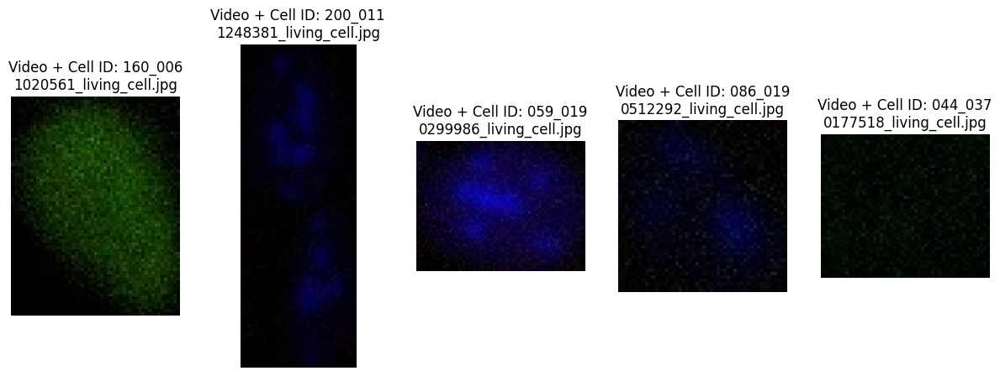

In [58]:
# Collect all cropped cell image paths
crop_paths = list(CROP_DIR.rglob("*.jpg"))
# Randomly pick five example images
crop_examples = random.sample(crop_paths, 5)
# Plot the five images
plt.figure(figsize=(15, 5))
for i, img_path in enumerate(crop_examples):
    # Load the current image
    img = cv2.imread(str(img_path))
    # Turn the image from BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Create five consecutive subplots
    plt.subplot(1, 5, i+1)
    plt.imshow(img_rgb)
    # Print folder and image name
    plt.title("Video + Cell ID: " + img_path.parts[-2] + "\n" + img_path.name)
    plt.axis('off')
plt.show()

## Part 3: Train the appearance model of DeepSORT

In [31]:
# Initialize different values for hyperparameters for in-depth analysis
batch_sizes = [16, 64] # Default: 32, not used in array because 32 already used in grid search for lrs + optimizer, prevent unnecessary double training
lrs = [0.0001, 0.001, 0.01] # Default: 0.001
optimizer = ["sgd", "nesterov", "adam"] # Default: SGD

In [63]:
# Train the appearance model through train.py of DeepSORT with different learning rates and optimizers
# Grid Search for two hyperparameters that interact strongly with each other; investigate impact of hyperparameters and find best performing pair
for lr in lrs:
    for opt in optimizer:
        print("---------------------------------------------------------------------------------")
        print(f"Appearance model with batch size: {32}, epochs: {40}, learning rate: {lr}, optimizer: {opt}")
        # Initialize model name for train.jpg
        model_name = f"{opt}_lr{lr}_batch{32}"
        # Train the model
        !python deep_sort_pytorch/deep_sort/deep/train.py --data-dir cell_crops --lr {lr} --optimizer {opt} --model_name {model_name}

---------------------------------------------------------------------------------
Appearance model with batch size: 32, epochs: 40, learning rate: 0.0001, optimizer: sgd
35831 images were found in the dataset.
30076 images for training.
5755 images for validation.
Using 8 dataloader workers every process
[epoch 0] train_loss: 8.195359230041504, train_acc: 0.0007979784545817263, val_loss: 8.046036720275879, val_acc: 0.002258905299739357
[epoch 1] train_loss: 8.102851867675781, train_acc: 0.000731480250033249, val_loss: 7.981041431427002, val_acc: 0.0031277150304083404
[epoch 2] train_loss: 8.048983573913574, train_acc: 0.0022941880569224632, val_loss: 7.905344009399414, val_acc: 0.007124239791485664
[epoch 3] train_loss: 8.003509521484375, train_acc: 0.003424657534246575, val_loss: 7.844191551208496, val_acc: 0.009035621198957428
[epoch 4] train_loss: 7.957406997680664, train_acc: 0.0045883761138449265, val_loss: 7.774637222290039, val_acc: 0.012858384013900956
[epoch 5] train_loss: 7.9

In [18]:
# Manually select the best values for the learning rate and optimizer
best_lr = 0.001
best_opt = "adam"

In [35]:
# Train the appearance model through train.py of DeepSORT with different batch sizes
# Greedy Search for batch size with best performing learning rate + optimizer pair; investigate impact of batch size and find best performing one
for size in batch_sizes:
    print("---------------------------------------------------------------------------------")
    print(f"Appearance model with batch size: {size}, epochs: {40}, learning rate: {best_lr}, optimizer: {best_opt}")
    # Initialize model name for train.jpg
    model_name = f"{best_opt}_lr{best_lr}_batch{size}"
    # Train the model
    !python deep_sort_pytorch/deep_sort/deep/train.py --data-dir cell_crops --batch_size {size} --lr {best_lr} --optimizer {best_opt} --model_name {model_name}

---------------------------------------------------------------------------------
Appearance model with batch size: 16, epochs: 40, learning rate: 0.001, optimizer: adam
35831 images were found in the dataset.
30076 images for training.
5755 images for validation.
Using 8 dataloader workers every process
[epoch 0] train_loss: 7.899585723876953, train_acc: 0.0018619497273573613, val_loss: 7.249871253967285, val_acc: 0.007645525629887055
[epoch 1] train_loss: 7.235929012298584, train_acc: 0.005552600079797846, val_loss: 6.505274772644043, val_acc: 0.014769765421372719
[epoch 2] train_loss: 6.717607021331787, train_acc: 0.009475994148158, val_loss: 5.9907612800598145, val_acc: 0.029192006950477845
[epoch 3] train_loss: 6.240011692047119, train_acc: 0.0170567894666844, val_loss: 5.631790637969971, val_acc: 0.03788010425716768
[epoch 4] train_loss: 5.808082103729248, train_acc: 0.03145365075142971, val_loss: 5.339610576629639, val_acc: 0.04882710686359687
[epoch 5] train_loss: 5.38293027877

In [20]:
# Manually select the best value for the batch size
best_batch_size = 64

In [22]:
# Train the final appearance model with the best performing hyperparameters
# Use 60 epochs, find optimal epoch count and use that model for tracking with DeepSORT
print(f"Final appearance model with batch size: {best_batch_size}, epochs: {60}, learning rate: {best_lr}, optimizer: {best_opt}")
# Initialize model name for train.jpg
model_name = f"final_version_{best_opt}_lr{best_lr}_batch{best_batch_size}"
# Train the model
!python deep_sort_pytorch/deep_sort/deep/train.py --data-dir cell_crops --epochs 60 --batch_size {best_batch_size} --lr {best_lr} --optimizer {best_opt} --model_name {model_name}

Final appearance model with batch size: 64, epochs: 60, learning rate: 0.001, optimizer: adam
35831 images were found in the dataset.
30076 images for training.
5755 images for validation.
Using 8 dataloader workers every process
[epoch 0] train_loss: 7.757401943206787, train_acc: 0.003125415613778428, val_loss: 6.909902095794678, val_acc: 0.012858384013900956
[epoch 1] train_loss: 6.911171913146973, train_acc: 0.007481048011703684, val_loss: 6.318154811859131, val_acc: 0.019635099913119028
[epoch 2] train_loss: 6.416890621185303, train_acc: 0.011337943875515361, val_loss: 5.948087692260742, val_acc: 0.030755864465682015
[epoch 3] train_loss: 6.021790504455566, train_acc: 0.018087511637185794, val_loss: 5.466050148010254, val_acc: 0.04291920069504779
[epoch 4] train_loss: 5.654324054718018, train_acc: 0.029225960899055724, val_loss: 5.313854217529297, val_acc: 0.04969591659426586
[epoch 5] train_loss: 5.335206985473633, train_acc: 0.04086314669503923, val_loss: 4.868237018585205, val_a

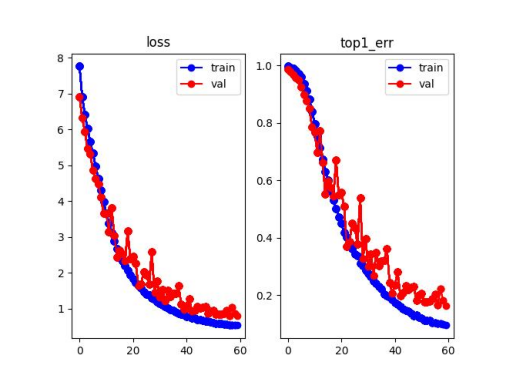

In [24]:
# Visualize the automatically generated train + val loss plot
train_val_img = mpimg.imread(f"train_graphics/train_final_version_{best_opt}_lr{best_lr}_batch{best_batch_size}.jpg")
plt.imshow(train_val_img)
plt.axis('off')
plt.show()

## Part 4: Track the cells with DeepSORT

In [18]:
def evaluate_all(acc, annots_by_img, all_test_frames, dets):
    """
    evaluate_all uses the tracking results as results.txt to evaluate the results with MOT metrics.

    :param acc: the MOTAccumulator required for using motmetrics
    :param annots_by_img: annotations grouped by their image ID
    :param all_test_frames: all frames from the test folder
    :param dets: a stacked array with tracklets from all results.txt files across the test folder
    
    :return: a summary DataFrame with evaluated MOT metrics on the whole test folder
    """ 
    # Group the list of tracklets by the frame they are on
    dets_by_frame = {}
    for r in dets:
        f, tid, x, y, w, h = r[:6].astype(int)
        dets_by_frame.setdefault(f, []).append((tid, x, y, w, h))
    # Loop through all the test frames
    for info in all_test_frames:
        fid = info["id"]
        fn = info["frame_id"]
        # Get the ground truth annotations for the test frames
        raw = annots_by_img.get(fid, [])
        gt_ids, gt_boxes = [], []
        for ann in raw:
            cid = ann["cell_id"]
            xc,yc,w_,h_ = ann["bbox"]
            x1,y1 = xc - w_/2, yc - h_/2
            gt_ids.append(cid)
            gt_boxes.append([x1, y1, x1 + w_, y1 + h_])
        # Get the prediction annotations for the test frames
        preds = dets_by_frame.get(fn, [])
        pred_ids  = [p[0] for p in preds]
        pred_boxes= [[p[1],p[2],p[1]+p[3],p[2]+p[4]] for p in preds]
        # Calculate the IoU distance as a cost matrix to determine how much GT boxes overlap with predicted boxes
        D = np.zeros((len(gt_boxes), len(pred_boxes)), dtype=float)
        for i, gb in enumerate(gt_boxes):
            for j, pb in enumerate(pred_boxes):
                xa, ya = max(gb[0], pb[0]), max(gb[1], pb[1])
                xb, yb = min(gb[2], pb[2]), min(gb[3], pb[3])
                inter = max(0, xb-xa)*max(0, yb-ya)
                ua = (gb[2]-gb[0])*(gb[3]-gb[1]) + \
                     (pb[2]-pb[0])*(pb[3]-pb[1]) - inter
                # Perfect match if IoU = 0 (instead of 1)
                iou = inter/ua if ua>0 else 0
                D[i,j] = 1 - iou
        acc.update(gt_ids, pred_ids, D, frameid=fid)
    # Compute a summary with MOT metrics
    mh = mm.metrics.create()
    acc.events.sort_index(inplace=True)
    return mh.compute(
        acc,
        # Use the MOT metrics mostly identified in the SORT and DeepSORT papers
        metrics=['mota', 'motp', 'num_switches', 'num_false_positives', 'num_misses', 'precision', 'recall', 'mostly_tracked', 'mostly_lost', 'num_fragmentations', 'idf1'],
        name='DeepSORT_all'
    )

In [20]:
def load_all_results(test_folders, base_dir="output"):
    """
    load_all_results reads each output/{test_folder}/results.txt and stacks them into one array to enable evaluating all tracking results at once.

    :param test_folders: test folders used for tracking
    :param base_dir: directory where the results have been saved
    
    :return: a stacked array with all tracking results across the test folders
    """ 
    # Initialize the array for collecting all tracking results
    all_dets = []
    for vn in test_folders:
        # Get the path of the results from the current folder
        p = Path(base_dir) / vn / "results.txt"
        # Load the results and add them to the all_dets array
        dets = np.loadtxt(str(p), delimiter=',')
        all_dets.append(dets)
    return np.vstack(all_dets)

In [22]:
# Select the best performing appearance model
best_model = 'deep_sort_pytorch/deep_sort/deep/checkpoint/model_59.pth'
# Ensure reproducibility with same sequence of random folders
random.seed(30)
# For validation, pick one reproducible random video / folder, reduces processing speed and enables motmetrics evaluation
# Pick 1 random video / folder from the full validation set
val_folders_sampled = random.sample(list(val_folders), 1)
# Change format of val_folders to strings so it can be passed to the track commands
val_folders_str = " ".join(val_folders_sampled)
# Initialize different values for tracking hyperparameters for in-depth analysis
# Max age: How many frames a track “lives on” without a match before it’s dropped
max_age = [15, 30, 45] # Default: 30
# n_init: How many consecutive detections before a new track is “confirmed”
n_init = [1, 3, 5] # Default: 3
# min confidence: Minimum detection score to feed into the tracker
min_confidence = [0.3, 0.5, 0.7] # Default: 0.5
# max IoU distance: IoU threshold for associating new detections to existing tracks
max_iou_distance = [0.5, 0.7, 0.9] # Default: 0.7
# max distance: Appearance (cosine) distance threshold for matching via custom trained appearance model
max_dist = [0.1, 0.2, 0.3] # Default: 0.2
# nms max overlap: Internal non maximal supression (NMS) IoU threshold upstream of tracking
nms_max_overlap = [0.5, 0.7, 0.9] # Default: 0.7

In [43]:
# Get a list of all val frames (images)
all_val_frames = []
for vn in val_folders_sampled:
    imgs = [
        img for img in img_by_id.values()
        if img["file_name"].startswith(vn + "/")
    ]
    imgs.sort(key=lambda x: x["frame_id"])
    all_val_frames.extend(imgs)

In [51]:
# Run the tracker with DeepSORT for different max_ages
for age in max_age:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {age}, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {age} --n_init 3 --min_confidence 0.5 --max_iou_distance 0.7 --max_dist 0.2 --nms_max_overlap 0.7
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 90.9% 0.990 264 23 369 99.7% 94.9% 98  3  112 83.0%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 30, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs  FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 88.9% 0.986 369 128 302 98.2% 95.8% 101  3  91 77.6%
--------------------------------

In [24]:
# Manually select the best value for the max_age
best_max_age = 15

In [55]:
# Run the tracker with DeepSORT for different n_inits
for n in n_init:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {best_max_age}, n_init: {n}, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {n} --min_confidence 0.5 --max_iou_distance 0.7 --max_dist 0.2 --nms_max_overlap 0.7
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 1, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 93.0% 0.989 318 87 97 98.8% 98.7% 108  1  27 81.8%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 90.9% 0.990 264 23 369 99.7% 94.9% 98  3  112 83.0%
------------------------------------

In [26]:
# Manually select the best value for the n_init
best_n_init = 3

In [59]:
# Run the tracker with DeepSORT for different min_confidence
for conf in min_confidence:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {best_max_age}, n_init: {best_n_init}, min_confidence: {conf}, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {best_n_init} --min_confidence {conf} --max_iou_distance 0.7 --max_dist 0.2 --nms_max_overlap 0.7
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.3, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 90.9% 0.990 264 23 369 99.7% 94.9% 98  3  112 83.0%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 90.9% 0.990 264 23 369 99.7% 94.9% 98  3  112 83.0%
----------------------------------

In [28]:
# Manually select the best value for the min_confidence
best_min_confidence = 0.5

In [63]:
# Run the tracker with DeepSORT for different max_iou_distance
for dist in max_iou_distance:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {best_max_age}, n_init: {best_n_init}, min_confidence: {best_min_confidence}, max_iou_distance: {dist}, max_dist: 0.2, nms_max_overlap: 0.7")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {best_n_init} --min_confidence {best_min_confidence} --max_iou_distance {dist} --max_dist 0.2 --nms_max_overlap 0.7
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.5, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 81.9% 0.982 520 13 771 99.8% 89.3% 82  3  264 61.8%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.7, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll MT ML   FM  IDF1
DeepSORT_all 90.9% 0.990 264 23 369 99.7% 94.9% 98  3  112 83.0%
----------------------------------

In [30]:
# Manually select the best value for the max_iou_distance
best_max_iou_distance = 0.9

In [67]:
# Run the tracker with DeepSORT for different max_dist
for dist in max_dist:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {best_max_age}, n_init: {best_n_init}, min_confidence: {best_min_confidence}, max_iou_distance: {best_max_iou_distance}, max_dist: {dist}, nms_max_overlap: 0.7")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {best_n_init} --min_confidence {best_min_confidence} --max_iou_distance {best_max_iou_distance} --max_dist {dist} --nms_max_overlap 0.7
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.9, max_dist: 0.1, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 96.5% 0.990  51 23 177 99.7% 97.5% 102  1  17 87.8%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.9, max_dist: 0.2, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 96.4% 0.989  55 26 176 99.6% 97.6% 102  1  15 87.6%
----------------------------------

In [32]:
# Manually select the best value for the max_dist
best_max_dist = 0.1

In [71]:
# Run the tracker with DeepSORT for different nms_max_overlap
for overlap in nms_max_overlap:
    print("---------------------------------------------------------------------------------")
    print(f"Track with DeepSORT with max_age: {best_max_age}, n_init: {best_n_init}, min_confidence: {best_min_confidence}, max_iou_distance: {best_max_iou_distance}, max_dist: {best_max_dist}, nms_max_overlap: {overlap}")
    # Run the DeepSORT tracker
    !python deep_sort_pytorch/deepsort.py --save_path "./output/val" --test_folders {val_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {best_n_init} --min_confidence {best_min_confidence} --max_iou_distance {best_max_iou_distance} --max_dist {best_max_dist} --nms_max_overlap {overlap}
    # Evaluate the DeepSORT tracker with selected MOT metrics
    # Load all results
    dets = load_all_results(val_folders_sampled, base_dir="output/val")
    # Evaluate across all test videos
    acc = mm.MOTAccumulator(auto_id=False)
    summary = evaluate_all(acc, annots_by_img, all_val_frames, dets)
    print("\n--- DeepSORT MOTMetrics Summary ---")
    print(mm.io.render_summary(
        summary,
        formatters=mm.metrics.create().formatters,
        namemap=mm.io.motchallenge_metric_names
    ))

---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.9, max_dist: 0.1, nms_max_overlap: 0.5
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 96.0% 0.990  65 26 201 99.6% 97.2% 100  1  20 88.7%
---------------------------------------------------------------------------------
Track with DeepSORT with max_age: 15, n_init: 3, min_confidence: 0.5, max_iou_distance: 0.9, max_dist: 0.1, nms_max_overlap: 0.7
---------------------------------------------------------------------------------
Run DeepSORT on 064...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 96.5% 0.990  51 23 177 99.7% 97.5% 102  1  17 87.8%
----------------------------------

In [34]:
# Manually select the best value for the nms_max_overlap
best_nms_max_overlap = 0.9

In [96]:
# For testing, pick one reproducible random video / folder, reduces processing speed and enables motmetrics evaluation
# Ensure reproducibility with same sequence of random folders
random.seed(1)
# Pick 1 random video / folder from the full testing set
test_folders_sampled = random.sample(list(test_folders), 1)
# Change format of test_folders to strings so it can be passed to the track commands
test_folders_str = " ".join(test_folders_sampled)

In [98]:
# Get a list of all test frames (images)
all_test_frames = []
for vn in test_folders_sampled:
    imgs = [
        img for img in img_by_id.values()
        if img["file_name"].startswith(vn + "/")
    ]
    imgs.sort(key=lambda x: x["frame_id"])
    all_test_frames.extend(imgs)

In [100]:
# Run the tracker with DeepSORT for the best performing values for the hyperparameters
!python deep_sort_pytorch/deepsort.py --save_path "./output/test" --test_folders {test_folders_str} --appearance_model {best_model} --max_age {best_max_age} --n_init {best_n_init} --min_confidence {best_min_confidence} --max_iou_distance {best_max_iou_distance} --max_dist {best_max_dist} --nms_max_overlap {best_nms_max_overlap}
# Evaluate the final DeepSORT tracker with selected MOT metrics
# Load all results
dets = load_all_results(test_folders_sampled, base_dir="output/test")
# Evaluate across all test videos
acc = mm.MOTAccumulator(auto_id=False)
summary = evaluate_all(acc, annots_by_img, all_test_frames, dets)
print("\n--- DeepSORT MOTMetrics Summary ---")
print(mm.io.render_summary(
    summary,
    formatters=mm.metrics.create().formatters,
    namemap=mm.io.motchallenge_metric_names
))

---------------------------------------------------------------------------------
Run DeepSORT on 085...

--- DeepSORT MOTMetrics Summary ---
              MOTA  MOTP IDs FP  FN  Prcn  Rcll  MT ML  FM  IDF1
DeepSORT_all 95.5% 0.995  83 23 182 99.6% 97.1% 109  4  35 91.0%


In [102]:
# For visualization: Use specific colors, and mapping category_id to color and name for easy lookup
CATEGORY_COLORS = {
    1: {'color': 'limegreen', 'name': cat_name_by_id.get(1, 'Living Cell')}, # Using cat_name_by_id
    2: {'color': 'red', 'name': cat_name_by_id.get(2, 'Dead Cell')}      # Using cat_name_by_id
}
PRED_COLOR = 'deepskyblue'
# Create a legend
legend_patches = [
    patches.Patch(color=CATEGORY_COLORS[1]['color'], label=f"GT {CATEGORY_COLORS[1]['name']}"),
    patches.Patch(color=CATEGORY_COLORS[2]['color'], label=f"GT {CATEGORY_COLORS[2]['name']}"),
    patches.Patch(color=PRED_COLOR, label="Predicted")
]

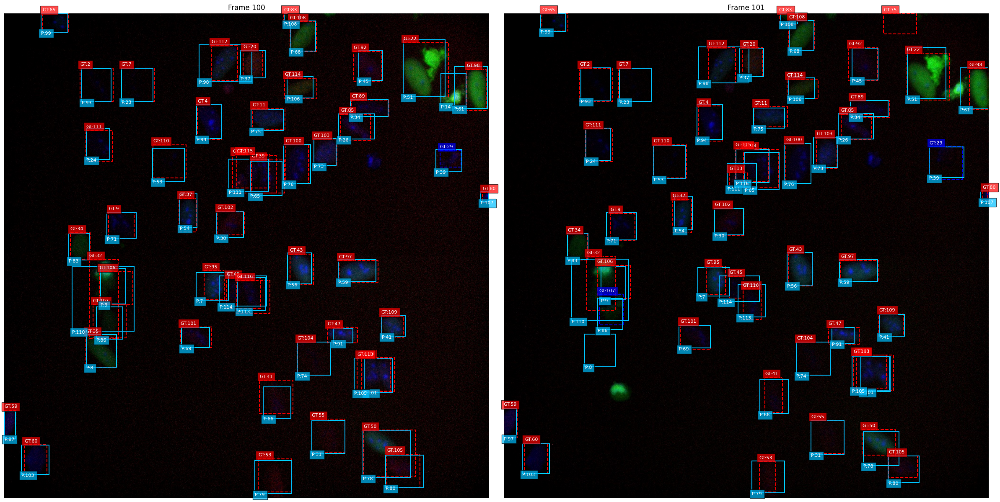

In [ ]:
# Visualize one example of two consecutive frames with the ground truth and predicted bounding boxes
# Set video and frame number
video_id = "085"
frame_no = 100
# Visualize the chosen frame and the very next one
frames_to_show = [frame_no, frame_no + 1]
# Load image info for this video
video_image_infos = [
    img for img in img_by_id.values()
    if img["file_name"].startswith(f"{video_id}/")
]
video_image_infos.sort(key=lambda x: x["frame_id"])
# Build a quick lookup from frame_id to image metadata
image_info_map = {img["frame_id"]: img for img in video_image_infos}
# Load the correct results.txt for this video
dets = np.loadtxt(f"output/test/{video_id}/results.txt", delimiter=',')
# Create a 1×2 subplot to show both frames side by side
fig, axes = plt.subplots(1, 2, figsize=(24, 12))
# Loop through both frames
for i, fn in enumerate(frames_to_show):
    ax = axes[i]
    # If that frame doesn't exist, skip it
    if fn not in image_info_map:
        ax.set_title(f"Frame {fn} missing")
        ax.axis('off')
        continue
    # Get image info for given frame
    viz_info = image_info_map[fn]
    # Build example_frame_data for this frame
    example_frame_data = {
        'image_path': DATASET_DIR / viz_info['file_name'],
        'gt_bboxes': [], 'gt_ids': [], 'gt_categories': [],
        'pred_bboxes': [], 'pred_ids': []
    }
    # Populate ground truth (center → corners)
    for ann in annots_by_img[viz_info['id']]:
        x_center, y_center, width, height = ann['bbox']
        x1, y1 = x_center - width/2, y_center - height/2
        example_frame_data['gt_ids'].append(ann['cell_id'])
        example_frame_data['gt_bboxes'].append([x1, y1, x1 + width, y1 + height])
        example_frame_data['gt_categories'].append(ann['category_id'])
    # Filter predictions for this frame
    frame_preds = [p for p in dets if int(p[0]) == fn]
    # Populate predictions (top-left → corners)
    for frame, tid, vid, x, y, width, height, *_ in frame_preds:
        x1, y1 = x, y
        x2, y2 = x + width, y + height
        example_frame_data['pred_ids'].append(int(tid))
        example_frame_data['pred_bboxes'].append([x1, y1, x2, y2])
    # Draw the image
    img = Image.open(example_frame_data['image_path']).convert("RGB")
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"Frame {fn}")
    # Draw ground truth bounding boxes (dashed)
    for (x1, y1, x2, y2), gid, cid in zip(
            example_frame_data['gt_bboxes'],
            example_frame_data['gt_ids'],
            example_frame_data['gt_categories']):
        # you can replace these colors or logic as desired
        col = 'red' if cid == 1 else 'blue'
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                 linewidth=1.5, edgecolor=col,
                                 facecolor='none', linestyle='--')
        ax.add_patch(rect)
        ax.text(x1, y1 - 5, f"GT:{gid}",  # omitting category name for brevity
                bbox=dict(facecolor=col, alpha=0.7),
                color='white', fontsize=8)
    # Draw predicted bounding boxes (solid)
    for (x1, y1, x2, y2), pid in zip(
            example_frame_data['pred_bboxes'],
            example_frame_data['pred_ids']):
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                 linewidth=1.5, edgecolor=PRED_COLOR,
                                 facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y2 + 5, f"P:{pid}",
                bbox=dict(facecolor=PRED_COLOR, alpha=0.7),
                color='white', fontsize=8)
plt.tight_layout()
plt.show()

In [106]:
def get_frame_example(vid_name, frame_no, annots_by_img, img_by_id, all_dets):
    """
    get_frame_example retrieves the ground truth and prediction data for a specific frame.

    :param vid_name: the video name (e.g. "001") the frame belongs to
    :param frame_no: the frame number (time step)
    :param annots_by_img: annotations grouped by their image ID
    :param img_by_id: images grouped by their ID
    :param all_dets: a stacked array with tracklets from all results.txt files across the test folders
    
    :return: a dictionary containing image path, ground truth boxes/IDs/categories, and predicted boxes/IDs
    """ 
    # Find the image metadata for the given video and frame number
    imgs = [
        img for img in img_by_id.values()
        if img["file_name"].startswith(vid_name + "/") and img["frame_id"] == frame_no
    ]
    # Get the first image (to be used for visualization of first special event)
    info = imgs[0]
    # Get the predictions for this frame
    frame_preds = [r for r in all_dets if int(r[0]) == frame_no]
    # Initialize the dictionary for this frame
    ex = {
        'image_path': DATASET_DIR / info["file_name"],
        'gt_bboxes': [], 'gt_ids': [], 'gt_categories': [],
        'pred_bboxes': [], 'pred_ids': []
    }
    # Loop through the ground truth annotations and add the IDs, categories and bounding boxes to the dictionary
    for ann in annots_by_img[info["id"]]:
        x_center, y_center, width, height = ann["bbox"]
        x1, y1 = x_center - width / 2, y_center - height / 2
        ex['gt_ids'].append(ann['cell_id'])
        ex['gt_categories'].append(ann['category_id'])
        ex['gt_bboxes'].append([x1, y1, x1 + width, y1 + height])
    # Loop through the predicted annotations and add the IDs and bounding boxes to the dictionary
    for _, tid, vid, x, y, width, height, *_ in frame_preds:
        ex['pred_ids'].append(int(tid))
        ex['pred_bboxes'].append([x, y, x + width, y + height])
    return ex

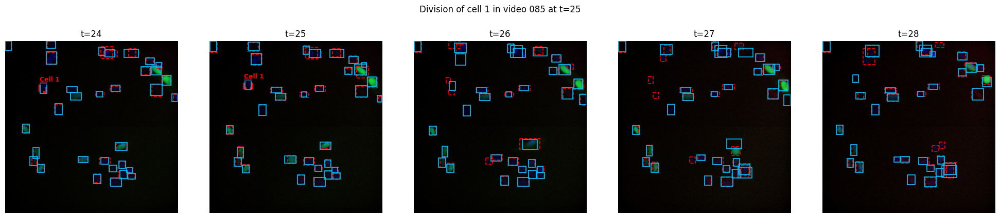

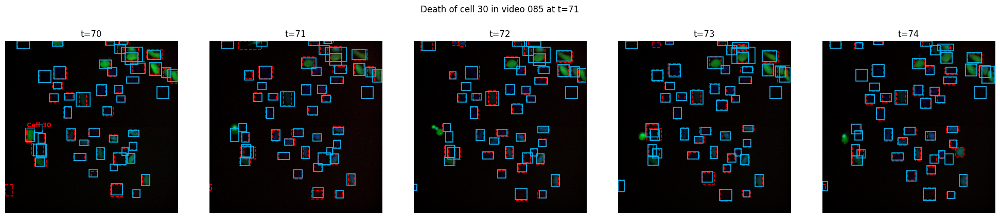

In [130]:
# Show a sequence of images to visualize how DeepSORT behaves during a cell division and cell death
# Load the stacked array with tracklets from all results.txt files across the test folders
all_results = load_all_results(test_folders_sampled, base_dir="output/test")
# Pick up to three examples each for cell division and cell death
num_examples = 3
chosen = {"division": [], "death": []}
# Loop through the array of special events to find the first example of a cell division and cell death
for vid_name, t_event, cellid, evtype in events:
    # Skip if the current video is not a test folder
    if vid_name not in test_folders_sampled:
        continue
    # If cell division has not yet three examples in chosen, add this special event, else skip
    # If cell dead has not yet three examples in chosen, add this special event, else skip
    if len(chosen[evtype]) < num_examples:
        chosen[evtype] = (vid_name, t_event, cellid)
    # Break the loop if three examples per special event (cell division, cell death) have been added to chosen
    if all(len(v) >= num_examples for v in chosen.values()):
        break
# Visualize both special events
for evtype, (vid_name, t_event, cellid) in chosen.items():
    # Specify a sequence of four images around the special event frame
    frames = list(range(max(0, t_event - 1), t_event + 4))
    fig, axes = plt.subplots(1, len(frames), figsize=(4 * len(frames), 4))
    fig.suptitle(f"{evtype.title()} of cell {cellid} in video {vid_name} at t={t_event}", y=1.05)
    # Retrieve the ground truth and prediction data for the specific frames
    for ax, fn in zip(axes, frames):
        ex = get_frame_example(vid_name, fn, annots_by_img, img_by_id, all_results)
        if ex is None:
            ax.axis('off')
            continue
        # Open the image for the specific frame and convert to RGB
        img = Image.open(ex['image_path']).convert("RGB")
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"t={fn}")
        # Draw ground truth bounding boxes (dashed)
        for (x1, y1, x2, y2), gid, cid in zip(ex['gt_bboxes'], ex['gt_ids'], ex['gt_categories']):
            is_event_cell = gid == cellid
            col = 'red'
            lw = 3 if is_event_cell else 1.2
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=lw, edgecolor=col,
                                     facecolor='none', linestyle='--')
            ax.add_patch(rect)
            # Specifically mark the cell that gets divided or dies
            if is_event_cell:
                ax.text(x1, y1 - 5, f"Cell {gid}", fontsize=9, color=col,
                        fontweight='bold', bbox=dict(facecolor='black', alpha=0.5, pad=1))
        # Draw predicted bounding boxes
        for (x1, y1, x2, y2), pid in zip(ex['pred_bboxes'], ex['pred_ids']):
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=1.2, edgecolor=PRED_COLOR,
                                     facecolor='none')
            ax.add_patch(rect)
    plt.tight_layout()
    plt.show()

## Part 5: Tracking with SORT

### Initialize all relevant data

In [43]:
import pandas as pd
from collections import defaultdict
from sort.sort import Sort
import gc

for img_data in coco["images"]:
    if "video_id" in img_data:
        # Convert to int first, then to string to remove leading zeros, handles both "085" and 85
        img_data["video_id"] = str(int(img_data["video_id"]))

# This image_info_by_id is used for tracking logic, video_id will be standardized
image_info_by_id = {img["id"]: (img["video_id"], img["frame_id"]) for img in coco["images"]}
# This image_metadata_by_id is for visualization, video_id will be standardized
image_metadata_by_id = {img['id']: img for img in coco["images"]}
# Get all unique video IDs (they are already standardized strings now)
all_video_ids_from_annotations = sorted(list(set(img["video_id"] for img in coco["images"])))

annotations_full = coco["annotations"]
images = coco["images"] # This 'images' list now contains standardized video_ids

gc.collect()
print("✅ Finished preparing")

✅ Finished preparing


In [44]:
# === Custom IoU matrix ===
def compute_iou_matrix(gt_boxes, pred_boxes):
    """
    Computes a matrix of 1 - IoU (Intersection over Union) distances between ground truth and predicted bounding boxes.
    """
    iou_matrix = np.zeros((len(gt_boxes), len(pred_boxes)), dtype=np.float32)
    for i, (x1, y1, w1, h1) in enumerate(gt_boxes):
        xa1, ya1, xa2, ya2 = x1, y1, x1 + w1, y1 + h1
        area_gt = w1 * h1

        for j, (x2, y2, w2, h2) in enumerate(pred_boxes):
            xb1, yb1, xb2, yb2 = x2, y2, x2 + w2, y2 + h2
            area_pred = w2 * h2

            inter_x1 = max(xa1, xb1)
            inter_y1 = max(ya1, yb1)
            inter_x2 = min(xa2, xb2)
            inter_y2 = min(ya2, yb2)

            inter_w = max(0, inter_x2 - inter_x1)
            inter_h = max(0, inter_y2 - inter_y1)
            inter_area = inter_w * inter_h

            union = area_gt + area_pred - inter_area
            iou = inter_area / union if union > 0 else 0.0
            iou_matrix[i, j] = 1.0 - iou
    return iou_matrix

In [45]:
# === Main processing function ===
def run_tracking_and_evaluation(params, annotations_full, image_info_by_id, all_video_ids_from_annotations):
    """
    Runs the SORT tracking and motmetrics evaluation with given parameters.
    """
    name_of_run = params['name']
    max_age = params['MAX_AGE']
    min_hits = params['MIN_HITS']
    iou_threshold = params['IOU_THRESHOLD']
    start_folder = params['START_FOLDER']
    end_folder = params['END_FOLDER']

    print(f"\n--- Starting run: {name_of_run} ---")
    print(f"Parameters: MAX_AGE={max_age}, MIN_HITS={min_hits}, IOU_THRESHOLD={iou_threshold}")
    if start_folder == end_folder:
        print(f"Folders: {start_folder} to {end_folder}")
    else:
        print(f"Video Nr.: {start_folder}")

    acc = mm.MOTAccumulator(auto_id=True)

    video_ids_to_process = []
    for vid_id_str in all_video_ids_from_annotations: # vid_id_str is already a standardized string like "85"
        try:
            vid_num = int(vid_id_str) # Convert to int for numerical range comparison
            if start_folder <= vid_num <= end_folder:
                 video_ids_to_process.append(vid_id_str) # Add the standardized string back
        except ValueError:
            # This should ideally not happen if video_id in annotations are numbers or "0XX" format
            print(f"Warning: Could not convert video ID '{vid_id_str}' to integer. Skipping.")
            continue

    total_frames_updated = 0
    tracking_results_by_video = {}

    for video_idx, video_id in enumerate(video_ids_to_process): # video_id is now consistently "85"
        print(f"Processing video {video_idx + 1}/{len(video_ids_to_process)}: Video ID {video_id}", end='\r')

        video_annotations_by_frame = defaultdict(list)
        video_tracking_results = []
        tracking_results_by_video[video_id] = video_tracking_results # Key is already "85" string

        for ann in annotations_full:
            img_id = ann["image_id"]
            if img_id in image_info_by_id:
                vid_id_from_img, frame_id = image_info_by_id[img_id] # vid_id_from_img is also standardized "85"
                if vid_id_from_img == video_id: # This comparison will now match correctly "85" == "85"
                    x, y, w, h = ann["bbox"]
                    x1, y1 = x - w / 2, y - h / 2
                    x2, y2 = x1 + w, y1 + h
                    bbox_for_sort = [x1, y1, x2, y2, 1.0]
                    video_annotations_by_frame[frame_id].append({
                        "cell_id": ann["cell_id"],
                        "bbox_gt": [x1, y1, w, h],
                        "bbox_sort": bbox_for_sort
                    })

        tracker = Sort(max_age=max_age, min_hits=min_hits, iou_threshold=iou_threshold)
        sorted_frames = sorted(video_annotations_by_frame.items())

        for frame_id, frame_data_list in sorted_frames:
            detections_for_sort = np.array([item["bbox_sort"] for item in frame_data_list])
            if detections_for_sort.size > 0:
                tracks = tracker.update(detections_for_sort)

                for track in tracks:
                    x1, y1, x2, y2, track_id = track
                    video_tracking_results.append({
                        "frame_id": frame_id,
                        "track_id": int(track_id),
                        "bbox": [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]
                    })

        gt_by_frame = defaultdict(list)
        for frame_id, frame_data_list in video_annotations_by_frame.items():
            for ann_item in frame_data_list:
                gt_by_frame[frame_id].append((ann_item["cell_id"], ann_item["bbox_gt"]))

        pred_by_frame = defaultdict(list)
        for trk in video_tracking_results:
            pred_by_frame[trk["frame_id"]].append((trk["track_id"], trk["bbox"]))

        all_frames_in_video = sorted(list(set(list(gt_by_frame.keys()) + list(pred_by_frame.keys()))))

        for frame_id in all_frames_in_video:
            gt = gt_by_frame.get(frame_id, [])
            pred = pred_by_frame.get(frame_id, [])

            gt_ids = [g[0] for g in gt]
            gt_boxes = [g[1] for g in gt]

            pred_ids = [p[0] for p in pred]
            pred_boxes = [p[1] for p in pred]

            if gt_boxes or pred_boxes:
                if gt_boxes and pred_boxes:
                    distances = compute_iou_matrix(gt_boxes, pred_boxes)
                    distances[distances > (1 - 0.5)] = np.nan
                    acc.update(gt_ids, pred_ids, distances)
                else:
                    acc.update(gt_ids, pred_ids, np.empty((len(gt_ids), len(pred_ids))))
                total_frames_updated += 1

    print(f"✅ Run {name_of_run}: Processed {total_frames_updated} frames.")
    return acc, name_of_run, total_frames_updated, tracking_results_by_video

### Run tracking and evaluation with different parameters

In [46]:
# === Define multiple parameter sets ===
parameter_sets = [
    {
        'name': 'Default',
        'MAX_AGE': 1,
        'MIN_HITS': 3,
        'IOU_THRESHOLD': 0.3,
        'START_FOLDER': 83,
        'END_FOLDER': 83
    },
    {
        'name': 'Strict_IoU',
        'MAX_AGE': 1,
        'MIN_HITS': 3,
        'IOU_THRESHOLD': 0.5,
        'START_FOLDER': 83,
        'END_FOLDER': 83
    },
    {
        'name': 'Relaxed_IoU',
        'MAX_AGE': 1,
        'MIN_HITS': 3,
        'IOU_THRESHOLD': 0.1,
        'START_FOLDER': 83,
        'END_FOLDER': 83
    },
    {
        'name': 'HigherMinHits',
        'MAX_AGE': 1,
        'MIN_HITS': 5,
        'IOU_THRESHOLD': 0.3,
        'START_FOLDER': 83,
        'END_FOLDER': 83
    },
    {
        'name': 'HigherMaxAge',
        'MAX_AGE': 5,
        'MIN_HITS': 3,
        'IOU_THRESHOLD': 0.3,
        'START_FOLDER': 83,
        'END_FOLDER': 83
    },
]

# === Run all parameter sets and store results ===
all_accumulators = {}
all_processed_frames_counts = {}
all_tracking_predictions = {}

for i, params in enumerate(parameter_sets):
    acc_obj, run_name, processed_frames, tracking_by_video = run_tracking_and_evaluation(
        params, annotations_full, image_info_by_id, all_video_ids_from_annotations
    )
    all_accumulators[run_name] = acc_obj
    all_processed_frames_counts[run_name] = processed_frames
    all_tracking_predictions[run_name] = tracking_by_video
    gc.collect()

print("\n--- Total Frames Processed Per Run ---")
total_count = 0
for run_name, count in all_processed_frames_counts.items():
    print(f"{run_name}: {count} frames")
    total_count += count
print(f"➡️ TOTAL: {total_count} frames")

# === Print all stored summaries in one go ===
print("\n=== Combined All Run Summaries ===")
mh = mm.metrics.create()

summary = mh.compute_many(
    list(all_accumulators.values()),
    metrics=['mota', 'motp', 'num_switches', 'num_false_positives', 'num_misses', 'precision', 'recall', 'mostly_tracked', 'mostly_lost', 'num_fragmentations', 'idf1'],
    names=list(all_accumulators.keys()),
    generate_overall=False
)

params_df = pd.DataFrame(parameter_sets).set_index('name')
params_to_display = ['MAX_AGE', 'MIN_HITS', 'IOU_THRESHOLD', 'START_FOLDER', 'END_FOLDER']
params_df_selected = params_df[params_to_display]
summary.index.name = 'name'
combined_summary = summary.join(params_df_selected)

print(mm.io.render_summary(
    combined_summary,
    formatters=mh.formatters,
    namemap=mm.io.motchallenge_metric_names
))


--- Starting run: Default ---
Parameters: MAX_AGE=1, MIN_HITS=3, IOU_THRESHOLD=0.3
Folders: 83 to 83
✅ Run Default: Processed 150 frames.

--- Starting run: Strict_IoU ---
Parameters: MAX_AGE=1, MIN_HITS=3, IOU_THRESHOLD=0.5
Folders: 83 to 83
✅ Run Strict_IoU: Processed 150 frames.

--- Starting run: Relaxed_IoU ---
Parameters: MAX_AGE=1, MIN_HITS=3, IOU_THRESHOLD=0.1
Folders: 83 to 83
✅ Run Relaxed_IoU: Processed 150 frames.

--- Starting run: HigherMinHits ---
Parameters: MAX_AGE=1, MIN_HITS=5, IOU_THRESHOLD=0.3
Folders: 83 to 83
✅ Run HigherMinHits: Processed 150 frames.

--- Starting run: HigherMaxAge ---
Parameters: MAX_AGE=5, MIN_HITS=3, IOU_THRESHOLD=0.3
Folders: 83 to 83
✅ Run HigherMaxAge: Processed 150 frames.

--- Total Frames Processed Per Run ---
Default: 150 frames
Strict_IoU: 150 frames
Relaxed_IoU: 150 frames
HigherMinHits: 150 frames
HigherMaxAge: 150 frames
➡️ TOTAL: 750 frames

=== Combined All Run Summaries ===
               MOTA  MOTP IDs  FP   FN   Prcn  Rcll MT

### Visualize results

In [47]:
def visualize_frames(video_id, frames_to_show, image_metadata_by_id, annotations_full, predictions, dataset_dir=DATASET_DIR):
    # Filter images for the given video using the standardized video_id
    video_image_infos = [
        img for img in image_metadata_by_id.values()
        if img["video_id"] == video_id
    ]
    video_image_infos.sort(key=lambda x: x["frame_id"])
    image_info_map = {img["frame_id"]: img for img in video_image_infos}

    if not image_info_map:
        print(f"ERROR: No images found for video ID '{video_id}'. image_info_map is empty.")
        print(f"  Passed video_id: '{video_id}' (type: {type(video_id)})")
        print(f"  Sample img_meta from image_metadata_by_id.values():")
        if image_metadata_by_id:
            for i, (img_id, img_data) in enumerate(image_metadata_by_id.items()):
                print(f"    Image ID: {img_id}, Video ID: {img_data.get('video_id', 'N/A')}, Frame ID: {img_data.get('frame_id', 'N/A')}, File Name: {img_data.get('file_name', 'N/A')}")
                if i >= 2: break # Print a few samples
        else:
            print("  image_metadata_by_id is completely empty.")
        return # Exit if no images are found

    # Create a 1x2 subplot to show both frames side by side
    fig, axes = plt.subplots(1, 2, figsize=(24, 12))

    for i, fn in enumerate(frames_to_show):
        ax = axes[i]
        if fn not in image_info_map:
            print(f"WARNING: Frame {fn} not found in image_info_map for video {video_id}. Skipping.")
            ax.set_title(f"Frame {fn} missing in video {video_id}")
            ax.axis('off')
            continue

        img_meta = image_info_map[fn]
        image_path = dataset_dir / img_meta["file_name"]

        print(f"\n--- Debugging Frame {fn} for Video {video_id} ---")
        print(f"  Image metadata for this frame:")
        print(f"    Image ID: {img_meta['id']}")
        print(f"    Video ID from meta: {img_meta['video_id']}")
        print(f"    Frame ID from meta: {img_meta['frame_id']}")
        print(f"    File Name from meta: {img_meta['file_name']}")

        if not image_path.exists():
            print(f"ERROR: Image file not found at {image_path}. Please check DATASET_DIR and file_name in annotations.")
            ax.set_title(f"Image not found for Frame {fn}")
            ax.axis('off')
            continue

        # Build ground truth from annotations
        gt_bboxes = []
        gt_ids = []
        gt_cats = []
        for ann in annotations_full:
            if ann["image_id"] == img_meta["id"]:
                x_center, y_center, width, height = ann["bbox"]
                x1 = x_center - width / 2
                y1 = y_center - height / 2
                gt_bboxes.append([x1, y1, x1 + width, y1 + height])
                gt_ids.append(ann["cell_id"])
                gt_cats.append(ann["category_id"])

        # Build predictions for this frame
        frame_preds = [p for p in predictions if p["frame_id"] == fn]
        pred_bboxes = []
        pred_ids = []
        for pred in frame_preds:
            x1, y1, w, h = pred["bbox"]
            pred_bboxes.append([x1, y1, x1 + w, y1 + h])
            pred_ids.append(pred["track_id"])

        # Show image
        img = Image.open(image_path).convert("RGB")
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Video {video_id} - Frame {fn}")

        # Draw GT boxes (dashed)
        for (x1, y1, x2, y2), cid, cat in zip(gt_bboxes, gt_ids, gt_cats):
            col = "red" if cat == 1 else "blue"
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=1.5, edgecolor=col,
                                     facecolor='none', linestyle='--')
            ax.add_patch(rect)
            ax.text(x1, y1 - 5, f"GT:{cid}", bbox=dict(facecolor=col, alpha=0.7),
                    color='white', fontsize=8)

        # Draw predictions (solid)
        for (x1, y1, x2, y2), pid in zip(pred_bboxes, pred_ids):
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                     linewidth=1.5, edgecolor=PRED_COLOR,
                                     facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y2 + 5, f"P:{pid}", bbox=dict(facecolor=PRED_COLOR, alpha=0.7),
                    color='white', fontsize=8)

    plt.tight_layout()
    plt.show()


--- Debugging Frame 99 for Video 83 ---
  Image metadata for this frame:
    Image ID: 12400
    Video ID from meta: 83
    Frame ID from meta: 99
    File Name from meta: 085/images/xy085c0t100.jpg

--- Debugging Frame 100 for Video 83 ---
  Image metadata for this frame:
    Image ID: 12401
    Video ID from meta: 83
    Frame ID from meta: 100
    File Name from meta: 085/images/xy085c0t101.jpg


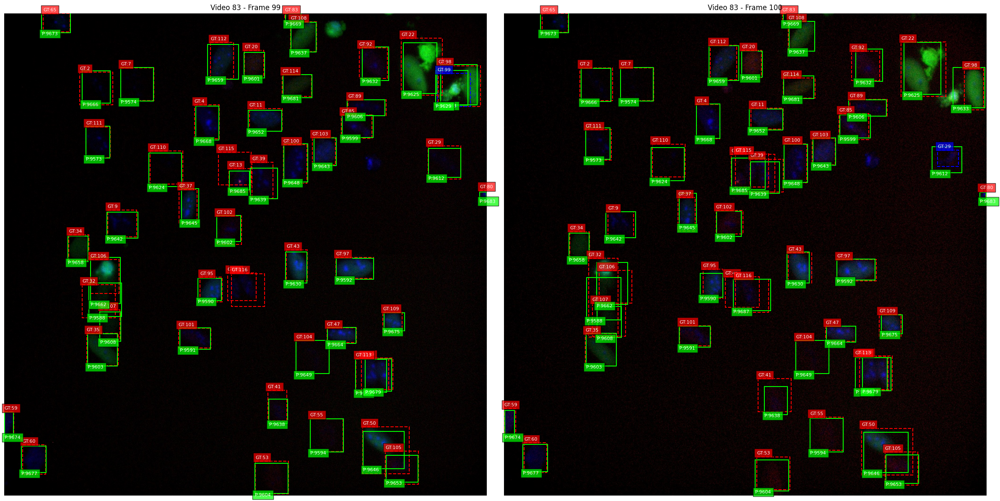

In [48]:
%matplotlib inline
# === Constants for Visualization ===
VIDEO_ID_TO_VISUALIZE = "83"  # somewhere the video_ids don't match up, but this corresponds to folder "085"
FRAME_NO = 99  # same problem with the frames...
FRAMES_TO_SHOW = [FRAME_NO, FRAME_NO + 1]
PRED_COLOR = "lime"

video_preds = all_tracking_predictions["Relaxed_IoU"][VIDEO_ID_TO_VISUALIZE]  # Select best performing model
visualize_frames(VIDEO_ID_TO_VISUALIZE, FRAMES_TO_SHOW, image_metadata_by_id, annotations_full, video_preds)